<a href="https://colab.research.google.com/github/difanaya/PCVK_Ganjil_2026/blob/main/Modul1/Modul1_D2_D3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D2 — Pengenalan Python untuk Membaca dan Menampilkan Image dengan pengenalan macam-macam Library
(Numpy, pandas, cv2, skimage, PIL, matplotlib).

### Langkah 1 — Import Library

In [27]:
import numpy as np
import pandas as pd
import cv2 as cv
try:
    from google.colab.patches import cv2_imshow  # hanya ada di Google Colab
except ImportError:
    import matplotlib.pyplot as _plt
    def cv2_imshow(img):
        # fallback untuk dijalankan di luar Colab: tampilkan pakai matplotlib
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB) if img.ndim == 3 else img
        _plt.imshow(img_rgb)
        _plt.axis('off')
        _plt.show()
from skimage import io
from skimage import transform
from PIL import Image
import matplotlib.pylab as plt

### Langkah 2 — Baca Image dari URLs

Catatan: `placekitten.com` di modul sudah tidak aktif, diabaikan saja.

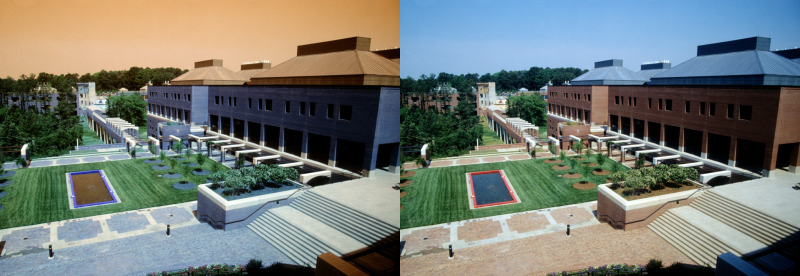

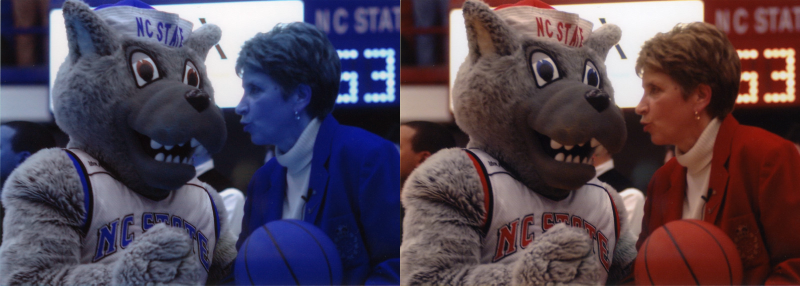



Gagal memuat url.


In [28]:
# Membuat list untuk menyimpan url dari beberapa image
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]
# baca dan tampilkan image
# loop pada tiap url image, beberapa image dapat disimpan pada list
for url in urls:
  try:
    image = io.imread(url)                          #read image
    image = cv.resize(image, (0,0), fx=0.5, fy=0.5) #resize image to half size
    image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)  #convert color to RGB
    final_frame = cv.hconcat((image, image_2))      #concatenate image
    cv2_imshow(final_frame)                         #show image
    print('\n')
  except Exception as e:
    print(f"Gagal memuat url.")


### Langkah 3 — Melihat Ukuran File Image

resolusi image: tinggi x lebar =  286  x  400


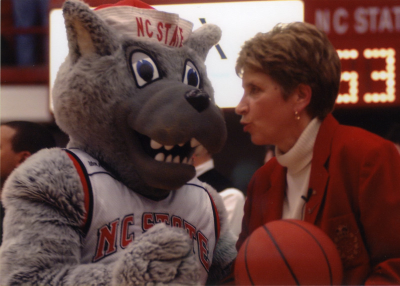

In [29]:
tinggi = image_2.shape[0]
lebar = image_2.shape[1]
print("resolusi image: tinggi x lebar = ", tinggi, " x ", lebar)
cv2_imshow(image_2)

### Langkah 4 — Akses Pixel: Garis Horizontal Putih di Tengah Image

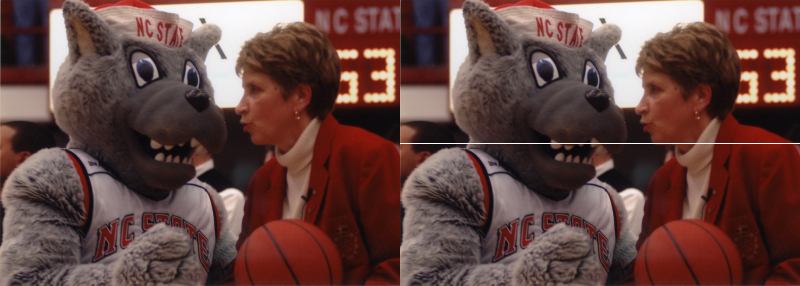

In [30]:
image_3 = image_2.copy()

# membuat garis horizontal ditengah image
for y in range(lebar):
    image_3[int(tinggi/2), y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_3))
cv2_imshow(final_frame)

## PERTANYAAN PRAKTIKUM D2

**1. Mengapa eksekusi kode Python pada modul ini dilakukan menggunakan Google Colab?**

Eksekusi Python dilakukan menggunakan Google Colab karena Colab menyediakan environment siap pakai di browser, mendukung notebook interaktif, mudah dihubungkan dengan Google Drive/GitHub, dan tidak mengharuskan mahasiswa menginstal semua library di laptop masing-masing.

**2. Kegunaan setiap library pada praktikum langkah ke-delapan? Apakah semua library harus digunakan?**

- `numpy` — manipulasi array/matriks, dasar representasi citra sebagai array piksel, operasi numerik (aljabar linear, dsb).
- `pandas` — manipulasi dan analisis data tabular (dipakai bila ada data pendukung berupa tabel, mis. label/metadata citra).
- `cv2 (OpenCV)` — operasi computer vision: membaca, menampilkan, mengubah ukuran, mengonversi warna, menggambar bentuk pada citra.
- `skimage (scikit-image)` — pemrosesan citra tingkat tinggi, termasuk `io.imread` untuk membaca citra dari file/URL dan `transform` untuk transformasi geometris.
- `matplotlib` — menampilkan citra dalam bentuk plot lengkap dengan sumbu (berguna melihat ukuran piksel), serta visualisasi grafik.

Tidak semua wajib dipakai di setiap sesi — pandas misalnya baru relevan bila mengolah data tabular. Untuk sekadar baca-tampilkan-olah citra, inti yang dipakai adalah numpy, cv2, dan matplotlib/skimage.

**3. `image = cv.resize(image, (0,0), fx=0.5, fy=0.5)` — kegunaan dan pengaruh jika tidak dilakukan?**

Potongan kode konversi warna seperti cv2.cvtColor(img, cv2.COLOR_BGR2RGB) digunakan karena OpenCV membaca citra dalam urutan channel BGR, sedangkan Matplotlib menampilkan citra dalam urutan RGB. Jika tidak dikonversi, warna yang tampil bisa tertukar, misalnya merah terlihat kebiruan.

**4. Kegunaan kode `[255,255,255]`?**

Nilai [255, 255, 255] adalah nilai warna putih pada citra 3 channel 8-bit. Setiap angka mewakili intensitas channel warna, dengan 0 paling gelap dan 255 paling terang.

**5. Keterkaitan pixel dan resolusi citra (tinggi/rendah)?**

Pixel adalah elemen terkecil penyusun gambar digital. Resolusi menunjukkan jumlah pixel pada gambar, misalnya lebar x tinggi. Semakin tinggi resolusi, semakin banyak pixel yang menyimpan detail sehingga gambar lebih tajam, tetapi ukuran data/file dan kebutuhan komputasinya juga lebih besar.

## TUGAS PRAKTIKUM D2

**1. Langkah-langkah praktikum sudah dilakukan di atas (Langkah 1-4).**

**2. Garis vertikal dan garis menyilang diagonal pada image keluaran**

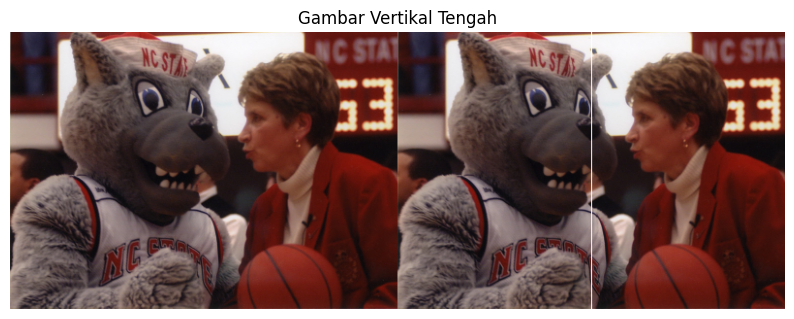

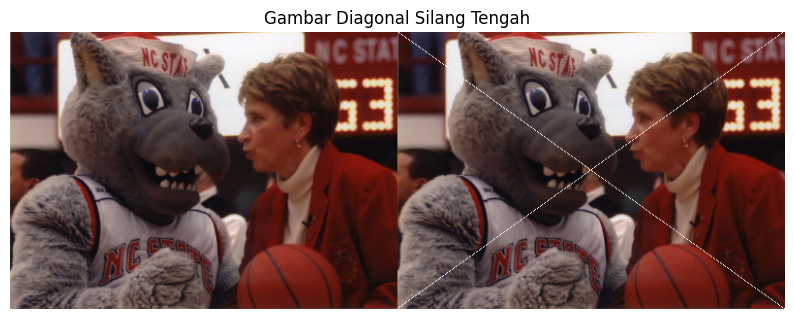

In [31]:
base = image.copy()
h, w, c = base.shape

img_vert = base.copy()
img_diag = base.copy()

mid_x = w // 2
for x in range(h):
  img_vert[x, int(w / 2)] = [255, 255, 255]

for y in range(min(h, w)):
  x1 = int(y * (w - 1) / (h - 1))
  x2 = int((h - 1 - y) * (w - 1) / (h - 1))

  img_diag[y, x1] = [255, 255, 255]
  img_diag[y, x2] = [255, 255, 255]

pair_vert = cv.hconcat([image, img_vert])
pair_diag = cv.hconcat([image, img_diag])

plt.figure(figsize=(10, 5))
plt.imshow(pair_vert)
plt.title("Gambar Vertikal Tengah")
plt.axis("off")
plt.show()


## SILANG
plt.figure(figsize=(10, 5))
plt.imshow(pair_diag)
plt.title("Gambar Diagonal Silang Tengah")
plt.axis("off")
plt.show()

**3. Garis horisontal putih di bagian tengah gambar dengan panjang tertentu**

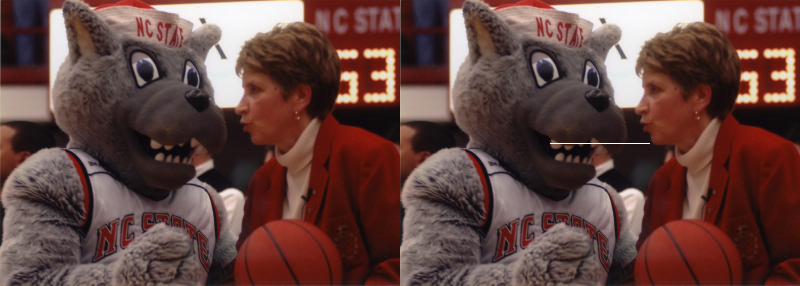

In [32]:
image_5 = image_2.copy()
panjang = 100  # panjang garis dalam pixel
start_x = lebar//2 - panjang//2
for y in range(start_x, start_x + panjang):
    image_5[tinggi//2, y] = [255,255,255]

final_frame = cv.hconcat((image_2, image_5))
cv2_imshow(final_frame)

**4. Kotak menggunakan kumpulan pixel putih di sembarang tempat dalam gambar**

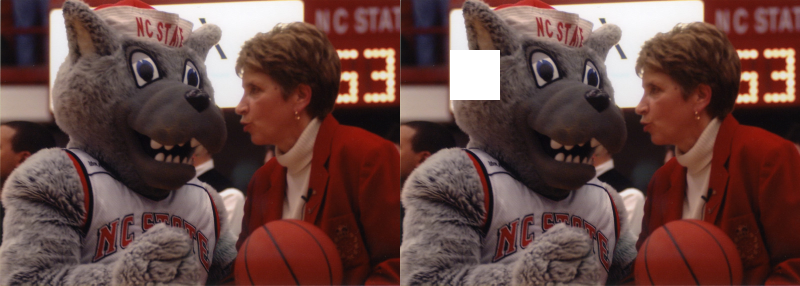

In [33]:
image_6 = image_2.copy()
image_6[50:100, 50:100] = [255,255,255]  # blok pixel putih (kotak) baris 50-100, kolom 50-100

final_frame = cv.hconcat((image_2, image_6))
cv2_imshow(final_frame)


# M1_D3 — Pengolahan Citra Dasar & Channel Warna pada OpenCV

### 1. Koneksi Google Drive (jalankan hanya di Google Colab)

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 2. Menyiapkan & Menampilkan Gambar

In [17]:
from google.colab import files
uploaded = files.upload()

Saving KTM.jpg to KTM.jpg


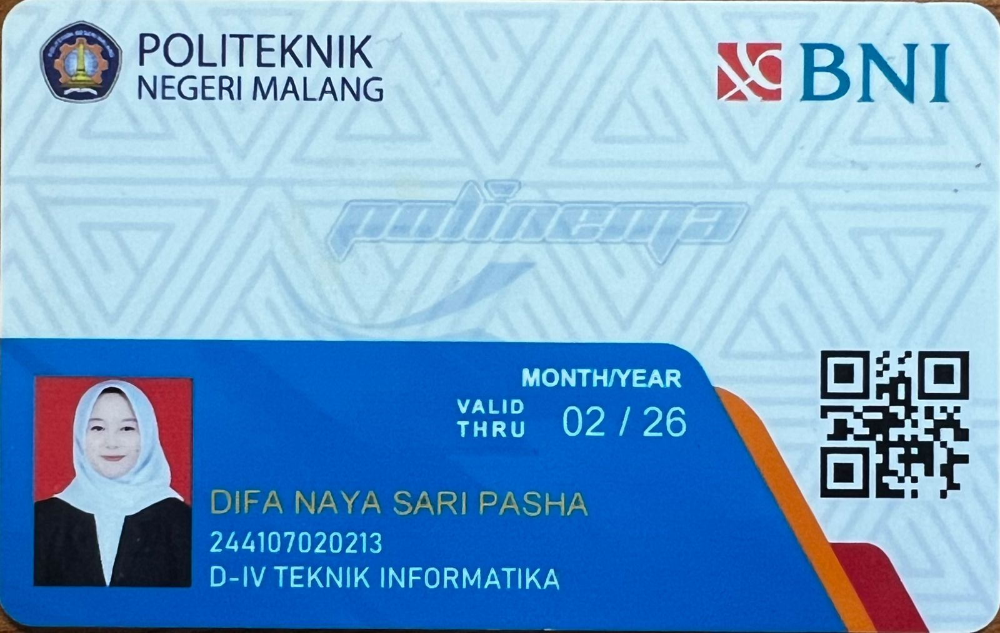

Resolusi gambar: 1600 x 1014


In [18]:
from google.colab.patches import cv_imshow

img = cv.imread("/content/drive/MyDrive/PCVK/KTM.jpg")
cv_imshow(img)

print("Resolusi gambar:", img.shape[1], "x", img.shape[0])

### Menampilkan Gambar (Image Plotting) dengan Matplotlib

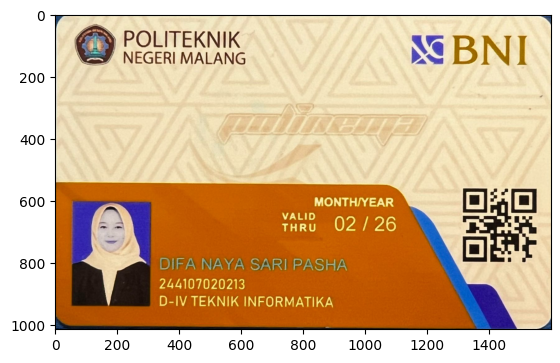

In [19]:
import matplotlib.pyplot as plt

img = cv.imread("/content/drive/MyDrive/PCVK/KTM.jpg")
plt.imshow(img)

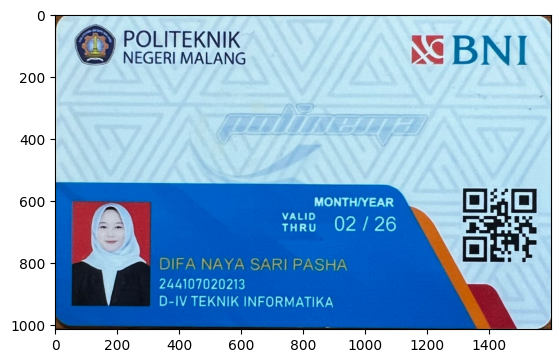

In [20]:
img = cv.imread("/content/drive/MyDrive/PCVK/KTM.jpg")
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

### 3. Menampilkan Citra Grayscale

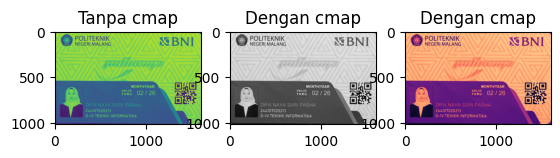

In [21]:
img_gray = cv.imread("/content/drive/MyDrive/PCVK/KTM.jpg", cv.IMREAD_GRAYSCALE)

#Tanpa cmap
plt.subplot(1,3,1)
plt.imshow(img_gray)
plt.title("Tanpa cmap")

#Dengan cmap
plt.subplot(1,3,2)
plt.imshow(img_gray, cmap="gray")
plt.title("Dengan cmap")

#Dengan cmap
plt.subplot(1,3,3)
plt.imshow(img_gray, cmap="magma")
plt.title("Dengan cmap")

plt.show()

### 4. Melakukan Resizing

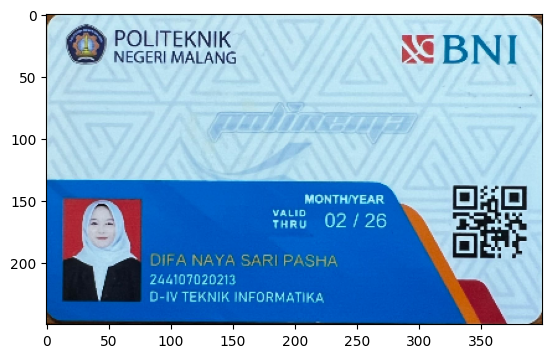

In [22]:
imgRGB=cv.cvtColor(img, cv.COLOR_BGR2RGB)
imgRGBsmall=cv.resize(imgRGB, (400,250))
plt.imshow(imgRGBsmall)

### 5. Melakukan Flipping

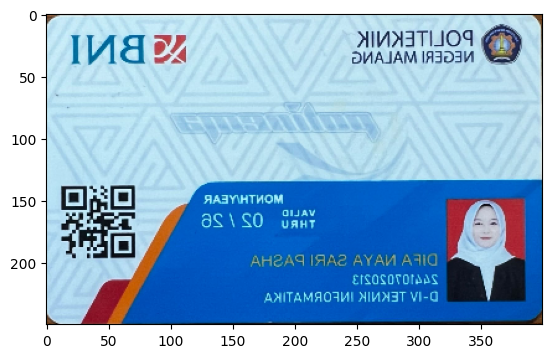

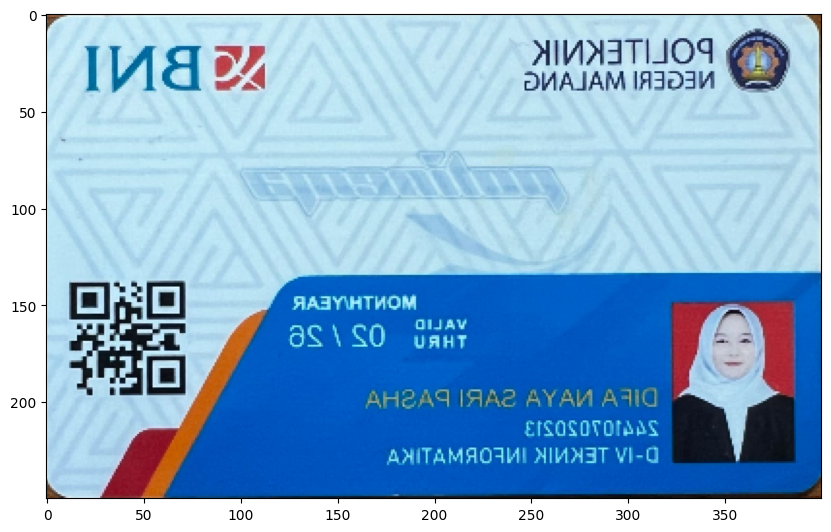

In [23]:
imgBalik = cv.flip(imgRGBsmall, 1)
plt.imshow(imgBalik)
plt.show()

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
ax.imshow(imgBalik)
plt.show()

### 6. Geometri 2D dengan OpenCV

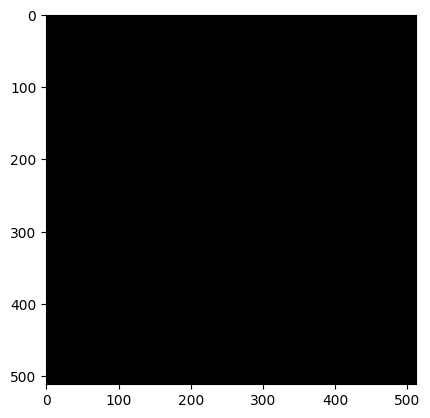

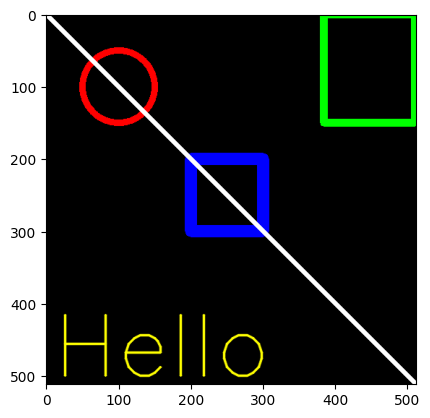

In [24]:
black_img = np.zeros(shape=(512,512,3), dtype=np.int16)
plt.imshow(black_img)
plt.show()

# persegi panjang
cv.rectangle(black_img, pt1=(384,0), pt2=(510,150), color=(0,255,0), thickness=10)
cv.rectangle(black_img, pt1=(200,200), pt2=(300,300), color=(0,0,255), thickness=15)

# lingkaran
cv.circle(black_img, center=(100,100), radius=50, color=(255,0,0), thickness=8)

# garis
cv.line(black_img, pt1=(0,0), pt2=(512,512), color=(255,255,255), thickness=5)

# text (opencv baru butuh tipe data CV_8U/uint8 utk putText)
black_img = black_img.astype(np.uint8)
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img, text='Hello', org=(10,500), fontFace=font, fontScale=4, color=(255,255,0), thickness=2, lineType=cv.LINE_AA)

plt.imshow(black_img)
plt.show()

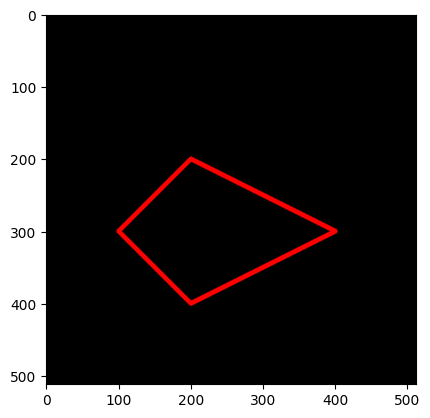

In [25]:
# black image dengan tipe data int32 + polyline
black_img2 = np.zeros(shape=(512,512,3), dtype=np.int32)

vertices = np.array([[100,300],[200,200],[400,300],[200,400]], dtype=np.int32)
pts = vertices.reshape((-1,1,2))  # nilai 2 menunjukkan tiap titik dibuat 1 baris x 2 kolom (x,y)

black_img2 = black_img2.astype(np.uint8)
cv.polylines(black_img2, [pts], isClosed=True, color=(255,0,0), thickness=5)
plt.imshow(black_img2)
plt.show()

#PERTANYAAN PRAKTIKUM D3

1. **Perbedaan gambar yang ditampilkan tanpa dan dengan matplotlib?**

Gambar yang ditampilkan tanpa Matplotlib, misalnya dengan cv2_imshow, ditampilkan langsung sebagai image output. Dengan Matplotlib, gambar masuk ke sistem plot sehingga bisa diberi figsize, judul, sumbu, colormap, subplot, dan pengaturan visual lain. Jika image dari OpenCV belum dikonversi BGR ke RGB, warna pada Matplotlib dapat terlihat tertukar.

2. **Perbedaan dan pengaruh pembuatan black image antara tipe data int16 dan int32?**

int16 menyimpan bilangan bulat 16-bit, sedangkan int32 menyimpan bilangan bulat 32-bit. int32 punya rentang nilai lebih besar, tetapi memakai memori lebih banyak. Untuk citra 8-bit biasa, tipe uint8 paling sesuai karena channel warna berada pada rentang 0-255.

3. **Kegunaan from google.colab.patches import cv2_imshow?**

from google.colab.patches import cv2_imshow digunakan di Google Colab sebagai pengganti cv2.imshow(). Fungsi cv2.imshow() membutuhkan jendela GUI lokal, sedangkan Colab berjalan di browser/server sehingga perlu cv2_imshow() agar gambar tampil di output notebook.

4. **Kegunaan from skimage import io?**

from skimage import io menyediakan fungsi input/output image, misalnya io.imread(), yang praktis untuk membaca image dari URL maupun path file.

#TUGAS PRAKTIKUM D3

### 1. Pengaruh figsize terhadap Ukuran Pixel

figsize hanya mengubah ukuran canvas/figure matplotlib saat ditampilkan (ukuran render di layar/di layout notebook) — bukan ukuran data citra itu sendiri. Array imgRGB.shape (jumlah pixel sebenarnya) tetap sama sebelum dan sesudah figsize diubah, dibuktikan pada sel di bawah.

###2. Tampilkan image dalam channel Red-Blue dan Green-Blue saja!

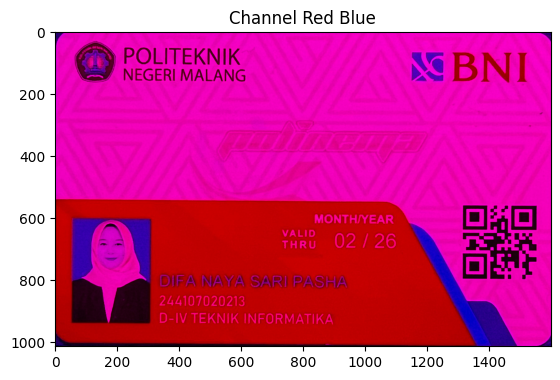

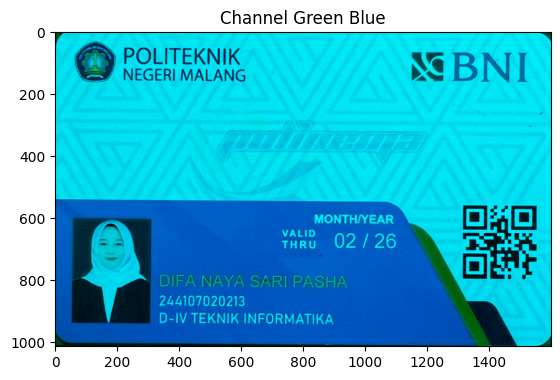

In [36]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

img_bgr = cv.imread('/content/drive/MyDrive/PCVK/KTM.jpg')
if img_bgr is None:
    print("Gagal membaca gambar")

img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)


img_rb = img_bgr.copy()
img_rb[:, :, 1] = 0
plt.imshow(img_rb)
plt.title("Channel Red Blue")
plt.show()

img_gb = img_rgb.copy()
img_gb[:, :, 0] = 0
plt.imshow(img_gb)
plt.title("Channel Green Blue")
plt.show()


### 3. Tampilkan image baris ke 20-115, kolom 25-120!

Text(0.5, 1.0, 'Crop: Baris 20-115, Kolom 25-120')

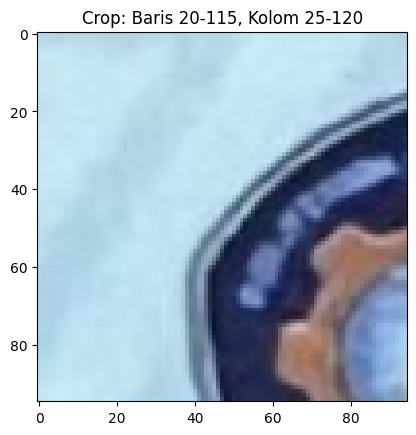

In [37]:
crop_img = img_rgb[20:115, 25:120]
plt.imshow(crop_img)
plt.title("Crop: Baris 20-115, Kolom 25-120")

### 4. Tampilkan Citra Baris ke-5 sampai 30, Semua Kolom, Channel Red Saja

Text(0.5, 1.0, 'Citra Baris ke-5 sampai 30, Semua Kolom, Channel Red Saja')

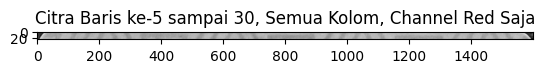

In [38]:
red_sliced = img_rgb[5:30, :, 0]
plt.imshow(red_sliced, cmap='gray')
plt.title("Citra Baris ke-5 sampai 30, Semua Kolom, Channel Red Saja")

### 5. Buat 5 Kotak Berbagai Ukuran dan Warna Berbeda Menggunakan Nilai Acak (Random)

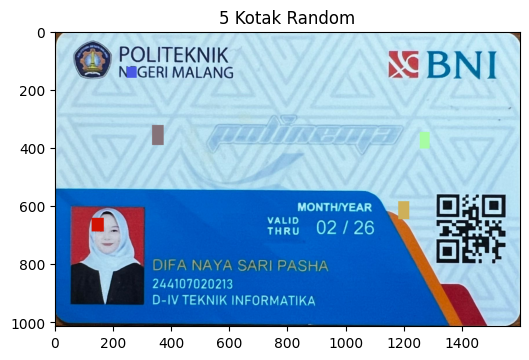

In [40]:
import random

img_boxes = img_rgb.copy()
h, w, _ = img_boxes.shape

for _ in range(5):
    # Koordinat sudut kiri atas (x1, y1)
    x1 = random.randint(0, w - 80)
    y1 = random.randint(0, h - 80)

    # Koordinat sudut kanan bawah (x2, y2)
    x2 = x1 + random.randint(30, 80)
    y2 = y1 + random.randint(30, 80)

    # Warna acak RGB
    color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

    # Gambar kotak (-1 untuk kotak terisi penuh/fill)
    cv.rectangle(img_boxes, (x1, y1), (x2, y2), color, -1)

plt.figure(figsize=(6, 6))
plt.imshow(img_boxes)
plt.title("5 Kotak Random")
plt.show()

### 6. Tampilkan Citra dengan Posisi Terbalik

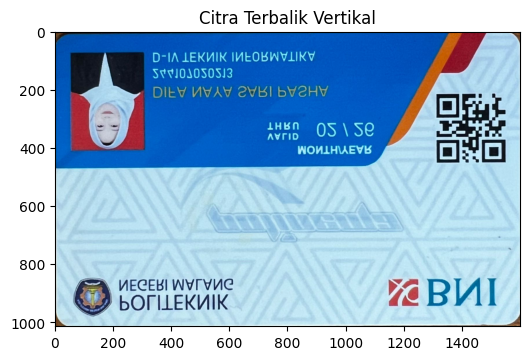

In [41]:
img_flipped = cv.flip(img_rgb, 0)

plt.figure(figsize=(6, 6))
plt.imshow(img_flipped)
plt.title("Citra Terbalik Vertikal")
plt.show()

### 7. Buat rectangle dan circle pada bagian wajah dari image foto s anda saat beraktifitas (bukan pasfoto).

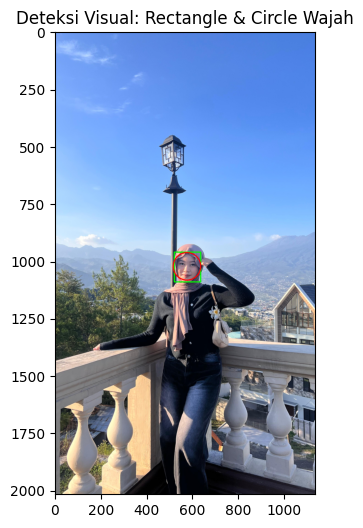

In [64]:
# Membaca foto pribadi beraktivitas
face = cv.imread('/content/drive/MyDrive/PCVK/Aktivitas.jpg')
face = cv.cvtColor(face, cv.COLOR_BGR2RGB)
face = cv.resize(face, (0, 0), fx=0.5, fy=0.5)

img_face = face.copy()
cv.rectangle(img_face, pt1=(520, 960), pt2=(635, 1090), color=(0, 255, 0), thickness=3)
cv.circle(img_face, center=(575, 1022), radius=60, color=(255, 0, 0), thickness=3)

plt.figure(figsize=(6, 6))
plt.imshow(img_face)
plt.title("Deteksi Visual: Rectangle & Circle Wajah")
plt.show()

### 8. Buat rectangle pada bagian sudut bawah kiri channel B pada color space RGB dari citra kitten/ lena/ mandrill/ male/ female/ couple/sailboat/ peppers!

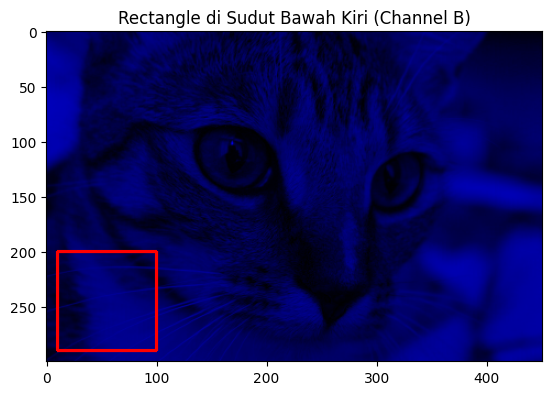

In [65]:
import cv2 as cv
import matplotlib.pyplot as plt
from skimage import data

img = data.chelsea() #pengganti kitten

b_channel = img.copy()
b_channel[:, :, 0] = 0  # Matikan Red
b_channel[:, :, 1] = 0  # Matikan Green
cv.rectangle(b_channel, pt1=(10, 200), pt2=(100, 290), color=255, thickness=2)

plt.imshow(b_channel)
plt.title("Rectangle di Sudut Bawah Kiri (Channel B)")
plt.show()

### 9. Lengkapi tulisan nama file pada file citra dari soal no.8. gunakan font, ukuran font, dan warna font yang sesuai keinginan anda.

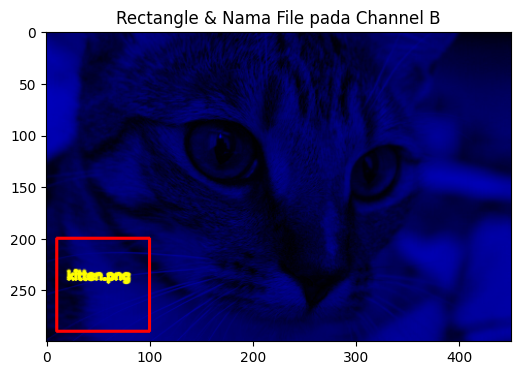

In [66]:
cv.putText(
    img=b_channel,
    text="kitten.png",
    org=(20, 240),
    fontFace=cv.FONT_ITALIC,
    fontScale=0.4,
    color=(255, 255, 0),
    thickness=2,
    lineType=cv.LINE_AA
)

plt.figure(figsize=(6, 6))
plt.imshow(b_channel)
plt.title("Rectangle & Nama File pada Channel B")
plt.show()